In [1]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince



IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
df = pd.read_csv("data/train.csv", sep = ";")
df = df.iloc[:, 0:8]

<h1> Preprocessing </h1>

In [3]:
pipe = Pipeline([('ordinal', OrdinalEncoder()), ('scaler', PowerTransformer())])
pipe_fit = pipe.fit(df)

data = pd.DataFrame(pipe_fit.transform(df), columns = df.columns)
data

,age,job,marital,education,default,balance,housing,loan
0,1.469546,0.093094,-0.286301,1.029751,-0.13549,0.996466,0.893915,-0.436803
1,0.417051,1.277591,1.379481,-0.254415,-0.13549,-0.775508,0.893915,-0.436803
2,-0.693452,-0.579713,-0.286301,-0.254415,-0.13549,-0.818578,0.893915,2.289359
3,0.667539,-1.017980,-0.286301,2.201328,-0.13549,0.646343,0.893915,-0.436803
4,-0.693452,1.652351,1.379481,2.201328,-0.13549,-0.820196,-1.118674,-0.436803
...,...,...,...,...,...,...,...,...
45206,0.977930,1.277591,-0.286301,1.029751,-0.13549,0.142935,-1.118674,-0.436803
45207,2.256815,0.371310,-1.892104,-1.734294,-0.13549,0.779764,-1.118674,-0.436803
45208,2.312138,0.371310,-0.286301,-0.254415,-0.13549,1.914392,-1.118674,-0.436803
45209,1.402760,-1.017980,-0.286301,-0.254415,-0.13549,-0.000442,-1.118674,-0.436803


<h1> Outliers </h1>

In [4]:
# https://github.com/yzhao062/pyod
clf = ECOD()
clf.fit(data)
outliers = clf.predict(data) 

data["outliers"] = outliers
df["outliers"] = outliers

# Data without outliers
data_no_outliers = data[data["outliers"] == 0]
data_no_outliers = data_no_outliers.drop(["outliers"], axis = 1)

# Data with Outliers
data_with_outliers = data.copy()
data_with_outliers = data_with_outliers.drop(["outliers"], axis = 1)

In [5]:
print(data_no_outliers.shape)
print(data_with_outliers.shape)

(40691, 8)
(45211, 8)


In [6]:
data_no_outliers

,age,job,marital,education,default,balance,housing,loan
0,1.469546,0.093094,-0.286301,1.029751,-0.13549,0.996466,0.893915,-0.436803
1,0.417051,1.277591,1.379481,-0.254415,-0.13549,-0.775508,0.893915,-0.436803
2,-0.693452,-0.579713,-0.286301,-0.254415,-0.13549,-0.818578,0.893915,2.289359
3,0.667539,-1.017980,-0.286301,2.201328,-0.13549,0.646343,0.893915,-0.436803
5,-0.461682,0.093094,-0.286301,1.029751,-0.13549,-0.486515,0.893915,-0.436803
...,...,...,...,...,...,...,...,...
45202,-0.575404,-1.611098,1.379481,-0.254415,-0.13549,-0.110334,-1.118674,-0.436803
45204,2.366828,0.371310,-0.286301,-0.254415,-0.13549,1.294853,-1.118674,-0.436803
45206,0.977930,1.277591,-0.286301,1.029751,-0.13549,0.142935,-1.118674,-0.436803
45209,1.402760,-1.017980,-0.286301,-0.254415,-0.13549,-0.000442,-1.118674,-0.436803


<h1> Modeling </h1>

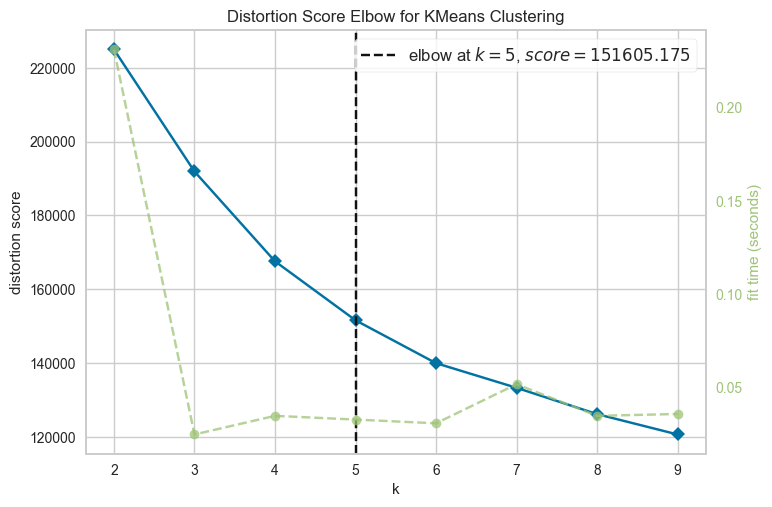

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [7]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10))
 
visualizer.fit(data_no_outliers)        # Fit the data to the visualizer
visualizer.show()       

In [8]:
# def make_Silhouette_plot(X, n_clusters):
#     plt.xlim([-0.1, 1])
#     plt.ylim([0, len(X) + (n_clusters + 1) * 10])
#     clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
#     cluster_labels = clusterer.fit_predict(X)
#     silhouette_avg = silhouette_score(X, cluster_labels)
#     print(
#         "For n_clusters =", n_clusters,
#         "The average silhouette_score is :", silhouette_avg,
#     )
# # Compute the silhouette scores for each sample
#     sample_silhouette_values = silhouette_samples(X, cluster_labels)
#     y_lower = 10
#     for i in range(n_clusters):
#         ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
#         ith_cluster_silhouette_values.sort()
#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i
#         color = cm.nipy_spectral(float(i) / n_clusters)
#         plt.fill_betweenx(
#             np.arange(y_lower, y_upper),
#             0,
#             ith_cluster_silhouette_values,
#             facecolor=color,
#             edgecolor=color,
#             alpha=0.7,
#         )
#         plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
#         y_lower = y_upper + 10
#         plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
#         plt.xlabel("The silhouette coefficient values", fontsize=24)
#         plt.ylabel("Cluster label", fontsize=24)
#         plt.axvline(x=silhouette_avg, color="red", linestyle="--")
#         plt.yticks([])  
#         plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
# range_n_clusters = list(range(2,10))
# for n_clusters in range_n_clusters:
#     print(f"N cluster: {n_clusters}")
#     make_Silhouette_plot(data_no_outliers, n_clusters)   
#     plt.savefig('Silhouette_plot_{}.png'.format(n_clusters))
#     plt.close()

<h2> The best number is 5-6 </h2>

In [9]:
km = KMeans(n_clusters=5, init='k-means++', n_init=10, max_iter=100, random_state=42)
clusters_predict = km.fit_predict(data_no_outliers)
print(km.inertia_)

149851.44705281625


In [10]:
np.unique(clusters_predict)

array([0, 1, 2, 3, 4])

In [11]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(data_no_outliers,clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(data_no_outliers,clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(data_no_outliers,clusters_predict)}")

Davies bouldin score: 1.5480952939773156
Calinski Score: 7646.959165727562
Silhouette Score: 0.2013600389183821


<h2> Visualitation </h2>

In [12]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(df, 
                        x='comp1', 
                        y='comp2', 
                        z='comp3',
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter(df, 
                        x='comp1', 
                        y='comp2', 
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


PCA 3D

In [13]:
pca_3d_object, df_pca_3d = get_pca_3d(data_no_outliers, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              1.493        18.66%                     18.66%
1              1.322        16.53%                     35.19%
2              1.055        13.18%                     48.37%


PCA 2D

In [14]:
pca_2d_object, df_pca_2d = get_pca_2d(data_no_outliers, clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.5)

<h1> T-SNE <h1>

TSNE 3D

In [15]:
sampling_data = data_no_outliers.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "PCA Space", opacity=1, width_line = 0.1)

In [16]:
plot_pca_3d(df_tsne_3d, title = "PCA Space", opacity=0.3, width_line = 0.1)

TSNE 2D

In [17]:
df_tsne_2d = TSNE(
                  n_components=2, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["comp1", "comp2"])
df_tsne_2d["cluster"] = sampling_clusters

plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=1, width_line = 0.5)


<h1> Explanations </h1>

In [18]:
data_no_outliers

,age,job,marital,education,default,balance,housing,loan
0,1.469546,0.093094,-0.286301,1.029751,-0.13549,0.996466,0.893915,-0.436803
1,0.417051,1.277591,1.379481,-0.254415,-0.13549,-0.775508,0.893915,-0.436803
2,-0.693452,-0.579713,-0.286301,-0.254415,-0.13549,-0.818578,0.893915,2.289359
3,0.667539,-1.017980,-0.286301,2.201328,-0.13549,0.646343,0.893915,-0.436803
5,-0.461682,0.093094,-0.286301,1.029751,-0.13549,-0.486515,0.893915,-0.436803
...,...,...,...,...,...,...,...,...
45202,-0.575404,-1.611098,1.379481,-0.254415,-0.13549,-0.110334,-1.118674,-0.436803
45204,2.366828,0.371310,-0.286301,-0.254415,-0.13549,1.294853,-1.118674,-0.436803
45206,0.977930,1.277591,-0.286301,1.029751,-0.13549,0.142935,-1.118674,-0.436803
45209,1.402760,-1.017980,-0.286301,-0.254415,-0.13549,-0.000442,-1.118674,-0.436803


[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000803 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 40691, number of used features: 8
[LightGBM] [Info] Start training from score -1.674050
[LightGBM] [Info] Start training from score -1.620832
[LightGBM] [Info] Start training from score -1.342985
[LightGBM] [Info] Start training from score -1.552154
[LightGBM] [Info] Start training from score -1.952469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


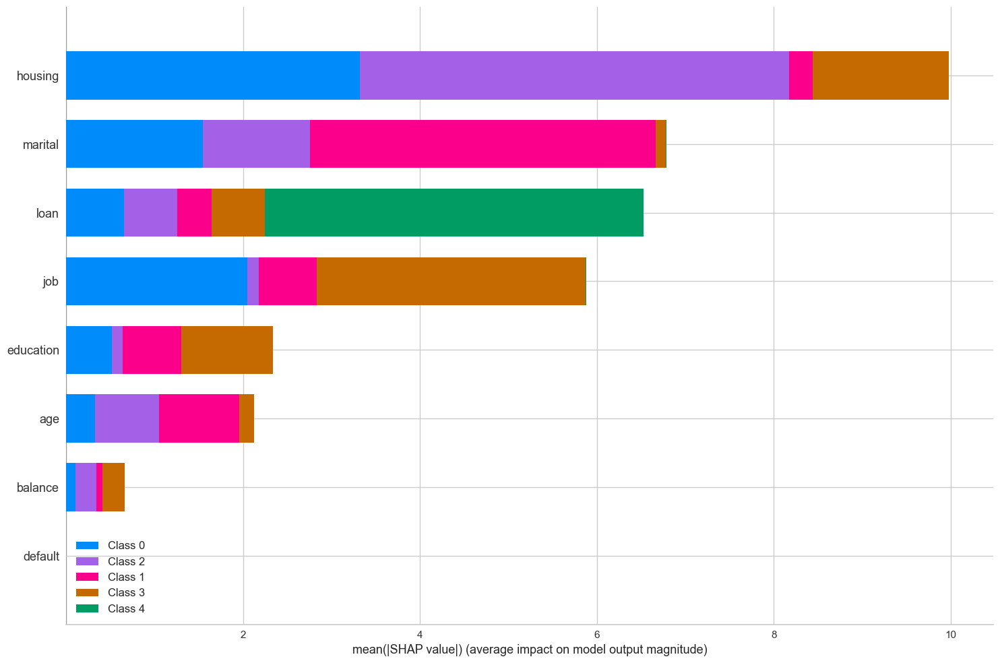

In [19]:
clf_km = lgb.LGBMClassifier(colsample_by_tree=0.8)
clf_km.fit(X = data_no_outliers , y = clusters_predict)

#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(data_no_outliers)
shap.summary_plot(shap_values_km, data_no_outliers, plot_type="bar", plot_size=(15, 10))

In [20]:
y_pred = clf_km.predict(data_no_outliers)
accuracy=accuracy_score(y_pred, clusters_predict)
print('Training-set accuracy score: {0:0.4f}'. format(accuracy))
print(classification_report(clusters_predict, y_pred))

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
Training-set accuracy score: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7629
           1       1.00      1.00      1.00      8046
           2       1.00      1.00      1.00     10623
           3       1.00      1.00      1.00      8618
           4       1.00      1.00      1.00      5775

    accuracy                           1.00     40691
   macro avg       1.00      1.00      1.00     40691
weighted avg       1.00      1.00      1.00     40691



Clusters Info

In [21]:
df_no_outliers = df[df.outliers == 0]
df_no_outliers["cluster"] = clusters_predict

df_no_outliers.groupby('cluster').agg(
    {
        'job': lambda x: x.value_counts().index[0],
        'marital': lambda x: x.value_counts().index[0],
        'education': lambda x: x.value_counts().index[0],
        'housing': lambda x: x.value_counts().index[0],
        'loan': lambda x: x.value_counts().index[0],
        # 'contact': lambda x: x.value_counts().index[0],
        'age':'mean',
        'balance': 'mean',
        'default': lambda x: x.value_counts().index[0],
        
    }
).reset_index()

C:\Users\damia\AppData\Local\Temp\ipykernel_13992\2567732966.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,cluster,job,marital,education,housing,loan,age,balance,default
0,0,management,married,secondary,yes,no,41.684624,1319.844541,no
1,1,management,single,tertiary,no,no,32.823142,1194.847750,no
2,2,management,married,secondary,no,no,46.594747,1441.781324,no
3,3,blue-collar,married,secondary,yes,no,39.370388,968.771989,no
4,4,blue-collar,married,secondary,yes,yes,40.676190,768.815758,no
